In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
%matplotlib inline

y = [5,4,3,2,2.1,1,.5,.3,.4,.9,1.4,2.0,2.3,1.9,1.7,2.5,3,4,5]
x = range(len(y))

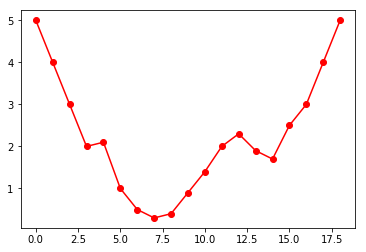

In [5]:
fig, ax = plt.subplots()
ax.plot(y, 'r-', marker='o')

In [8]:
import ruptures as rpt
# creation of data
n, dim = 500, 3  # number of samples, dimension
n_bkps, sigma = 3, 5  # number of change points, noise standart deviation
signal, bkps = rpt.pw_constant(n, dim, n_bkps, noise_std=sigma)

In [11]:
signal[:10,:]

array([[  4.50582237,   5.85841692,   4.31461953],
       [ -5.3581912 ,  -4.60763808,  -2.05440128],
       [  3.8659259 ,   7.29562844,   3.58988717],
       [ -0.25171092,  -1.35444725,   8.10766527],
       [ -2.20347433,   5.2799322 ,   8.97768157],
       [ -0.65110095,   5.5572981 ,   1.4987349 ],
       [  1.31641673,  -3.63293136,   7.44698467],
       [  3.65997088,   5.87110977,   5.31749415],
       [  0.63529662,  12.94477077,  11.44799198],
       [  3.22351981,   0.74992166,   2.56713186]])

In [61]:
model = "l2"  # "l1", "rbf", "linear", "normal", "ar"
algo = rpt.BottomUp(model=model).fit(np.array(y))
my_bkps = algo.predict(n_bkps=8)

In [62]:
my_bkps = np.array(my_bkps)-1
print (my_bkps)

[ 4  9 14 18]


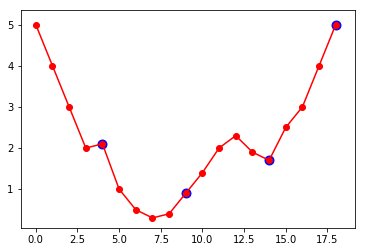

In [63]:
fig, ax = plt.subplots()
ax.plot(y, 'r-', marker='o')
yy = [y[i] for i in my_bkps]
ax.scatter(my_bkps, yy, c = "b", s= 80)

In [64]:
len(y)

19

In [2]:
import pandas as pd
df = pd.read_csv("newdf.csv")

In [4]:
df.head()

,Unnamed: 0,Unnamed: 0.1,curve_id,date,pca_value,lh,ls
0,135692,135692,20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0,2016-03-14,-0.003691,0.14,0.54
1,135693,135693,20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0,2016-03-14,-0.003663,0.13,0.52
2,135694,135694,20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0,2016-03-14,-0.003634,0.20,0.54
3,135695,135695,20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0,2015-11-03,-0.003631,0.18,0.54
4,135696,135696,20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0,2015-11-03,-0.003617,0.19,0.54


In [5]:
i = 0
sizes = [frame.shape[0] for (crv_id, frame) in df.groupby('curve_id')]


(array([ 87.,  43.,  11.,   5.,   1.,   1.,   0.,   1.,   0.,   1.]),
 array([    14. ,   1094.1,   2174.2,   3254.3,   4334.4,   5414.5,
          6494.6,   7574.7,   8654.8,   9734.9,  10815. ]),
 <a list of 10 Patch objects>)

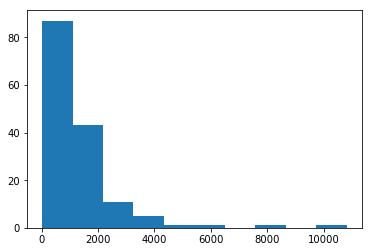

In [8]:
plt.hist(sizes, 10)

In [9]:
df.set_index(['curve_id', 'date'], inplace=True)

In [10]:
df.head()

Unnamed: 0  \
curve_id                                          date                     
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2016-03-14      135692   
                                                  2016-03-14      135693   
                                                  2016-03-14      135694   
                                                  2015-11-03      135695   
                                                  2015-11-03      135696   

                                                              Unnamed: 0.1  \
curve_id                                          date                       
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2016-03-14        135692   
                                                  2016-03-14        135693   
                                                  2016-03-14        135694   
                                                  2015-11-03        135695   
                                                  2015-11-03        135696   

                                                              pca_value    lh  \
curve_id                                          date                          
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2016-03-14  -0.003691  0.14   
                                                  2016-03-14  -0.003663  0.13   
                                                  2016-03-14  -0.003634  0.20   
                                                  2015-11-03  -0.003631  0.18   
                                                  2015-11-03  -0.003617  0.19   

                                                                ls  
curve_id                                          date              
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2016-03-14  0.54  
                                                  2016-03-14  0.52  
                                                  2016-03-14  0.54  
                                                  2015-11-03  0.54  
                                                  2015-11-03  0.54

In [17]:
sizes=[]
for i, mdf in df.groupby(level='curve_id'):
    sizes.append(len(mdf.groupby(level='date').groups))

(array([ 42.,  17.,  11.,  22.,  20.,  11.,  20.,   4.,   1.,   2.]),
 array([  2. ,   3.9,   5.8,   7.7,   9.6,  11.5,  13.4,  15.3,  17.2,
         19.1,  21. ]),
 <a list of 10 Patch objects>)

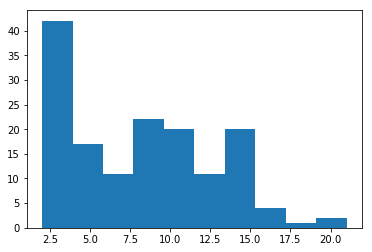

In [18]:
plt.hist(sizes, 10)

In [28]:
x = {'a':1, 'b':3, 'c':2}

#np.median(x.values())

[1, 3, 2]

In [39]:
def find_med(dic):
    if len(dic)&1:
        return [crd for crd, mu in dic.items() if mu==np.median(list(dic.values()))][0]
    else:
        med_value = list(sorted(dic.items(), key=lambda x:x[1]))[int(len(dic)/2)][1]
        return [crd for crd, mu in dic.items() if mu==med_value][0]
find_med({'a':1, 'b':3, 'c':2, 'd':4})


'b'

In [44]:
import scipy.signal as ss
import ruptures as rpt
crv_med_dic = {} ##curve : median_date
for crv_id, frame in df.groupby(level='curve_id'):
    mean_dic = dict(tuple([date, np.mean(ss.medfilt(mdf['lh'], 5))] for date, mdf in frame.groupby(level='date')))
    crv_med_dic[crv_id] = find_med(mean_dic)
   

In [58]:
df.loc[list(crv_med_dic.items())[0]].head()

E:\Anaconda\Anaconda4.0\envs\py36\lib\site-packages\ipykernel_launcher.py:1: PerformanceWarning: indexing past lexsort depth may impact performance.
  """Entry point for launching an IPython kernel.


Unnamed: 0  \
curve_id                                          date                     
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2013-05-21      135720   
                                                  2013-05-21      135725   
                                                  2013-05-21      135730   
                                                  2013-05-21      135735   
                                                  2013-05-21      135740   

                                                              Unnamed: 0.1  \
curve_id                                          date                       
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2013-05-21        135720   
                                                  2013-05-21        135725   
                                                  2013-05-21        135730   
                                                  2013-05-21        135735   
                                                  2013-05-21        135740   

                                                              pca_value    lh  \
curve_id                                          date                          
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2013-05-21  -0.003474  0.63   
                                                  2013-05-21  -0.003446  0.71   
                                                  2013-05-21  -0.003418  0.71   
                                                  2013-05-21  -0.003389  0.70   
                                                  2013-05-21  -0.003361  0.70   

                                                                ls  
curve_id                                          date              
20-DE - Elk-CD76---3-421-1746.0-420-4600.0-2518.0 2013-05-21  0.55  
                                                  2013-05-21  0.57  
                                                  2013-05-21  0.57  
                                                  2013-05-21  0.57  
                                                  2013-05-21  0.57

In [64]:
model = "l2"  # "l1", "rbf", "linear", "normal", "ar"
from collections import defaultdict
bks = defaultdict(list)
for crv, date in crv_med_dic.items():
    signal = df.loc[crv, date][['pca_value', 'lh']]
    signal['lh'] = ss.medfilt(signal['lh'], 5)
    algo = rpt.BottomUp(model=model).fit(signal)
    my_bkps = algo.predict(n_bkps=4)
    bks[crv] = my_bkps

E:\Anaconda\Anaconda4.0\envs\py36\lib\site-packages\ipykernel_launcher.py:5: PerformanceWarning: indexing past lexsort depth may impact performance.
  """


out boundary!
out boundary!
out boundary!
out boundary!


E:\Anaconda\Anaconda4.0\envs\py36\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!
out boundary!


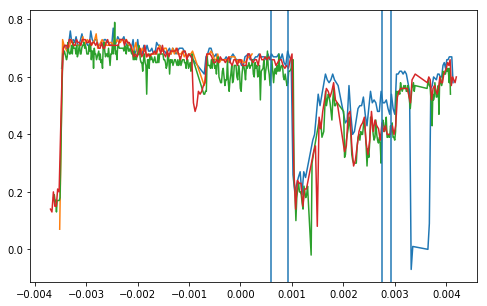

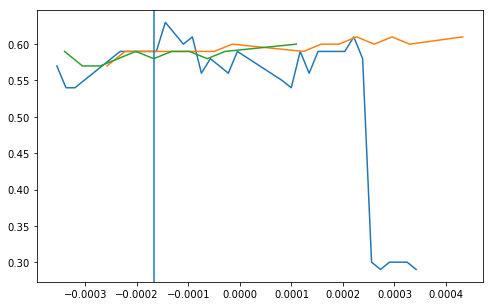

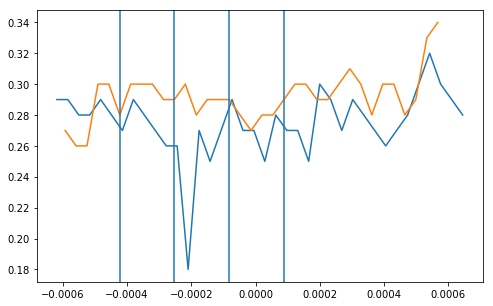

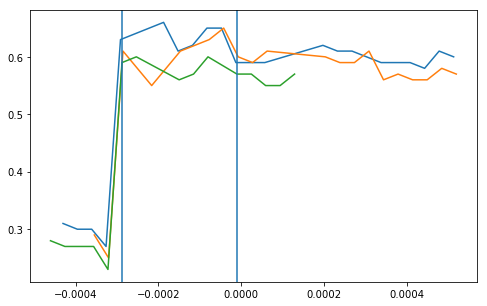

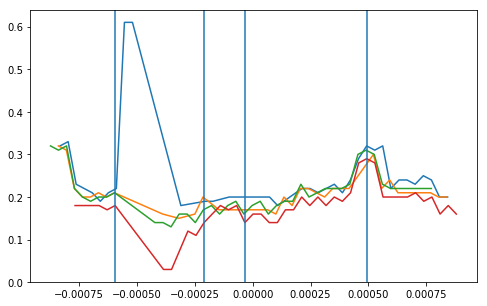

...

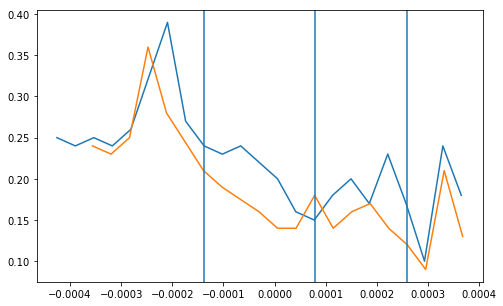

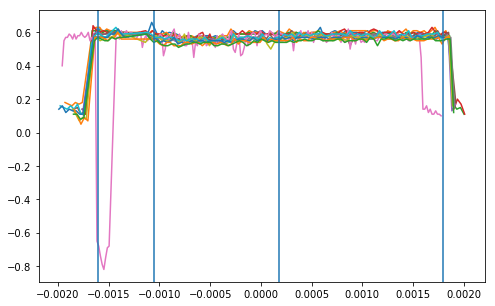

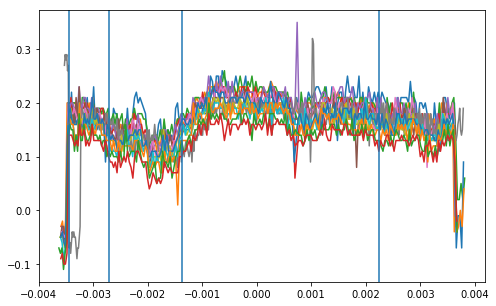

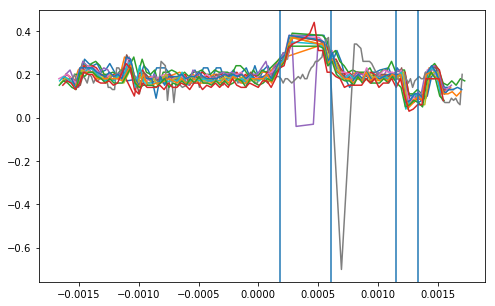

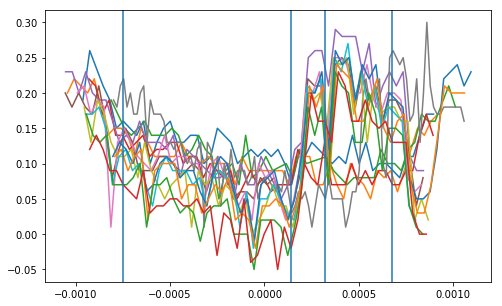

In [71]:
for crv, my_bkps in bks.items():
    fig, ax = plt.subplots(figsize=(8,5))
    frame = df.loc[crv]
    for date, mdf in frame.groupby(level='date'):
        ax.plot(mdf['pca_value'], mdf['lh'])
    for i in my_bkps[:-1]:
        try:
            ax.axvline(x=mdf['pca_value'].tolist()[i])
        except:
            print('out boundary!')
    plt.savefig(str(crv) + ".png")
    

In [47]:

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(signal['pca_value'], signal['lh'], 'r-', marker='o')
for i in my_bkps[:-1]:
    ax.axvline(x=signal['pca_value'].tolist()[i])

(500, 3)

In [49]:
model = 'l2'
signal = df.loc[list(crv_med_dic.items())[0]][['pca_value', 'lh']]
algo = rpt.BottomUp(model=model).fit(signal)
my_bkps = algo.predict(n_bkps=4)

E:\Anaconda\Anaconda4.0\envs\py36\lib\site-packages\ipykernel_launcher.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  


In [50]:
my_bkps

[135, 145, 190, 195, 212]

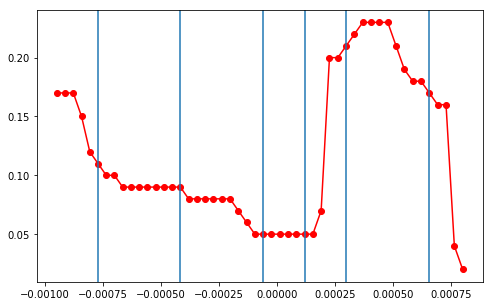